# 1. SDG Heatmap by Year

In [15]:
filepath=r"C:\Users\Praduman\Downloads\Final_Data.xlsx"

C:\Users\Praduman\AppData\Local\Temp\ipykernel_34892\4242830420.py:19: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


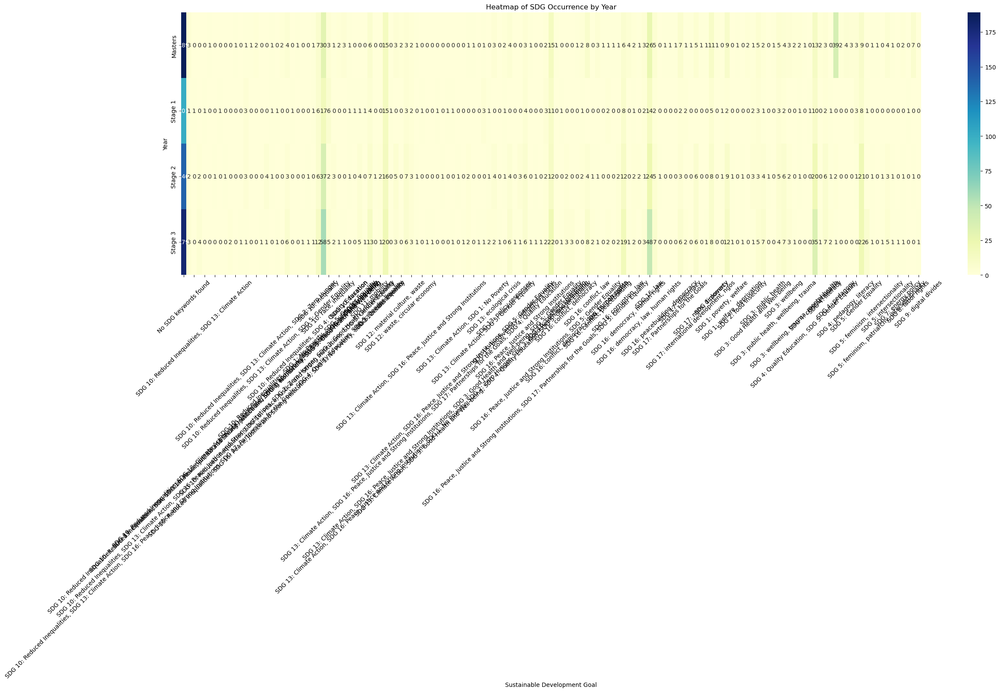

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load and prepare data
df = pd.read_excel(filepath)
df['Matched SDG Keywords'] = df['Matched SDG Keywords'].fillna('')
df_exploded = df.assign(SDG=df['Matched SDG Keywords'].str.split('; ')).explode('SDG')
df_exploded['SDG'] = df_exploded['SDG'].str.strip()

# Heatmap
heatmap_data = df_exploded.groupby(['Year', 'SDG']).size().unstack(fill_value=0)
plt.figure(figsize=(28, 8))
sns.heatmap(heatmap_data, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Heatmap of SDG Occurrence by Year")
plt.xlabel("Sustainable Development Goal")
plt.ylabel("Year")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# 2. Bipartite Network Diagram (Modules ↔ SDGs)

C:\Users\Praduman\AppData\Local\Temp\ipykernel_23828\2694502609.py:21: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



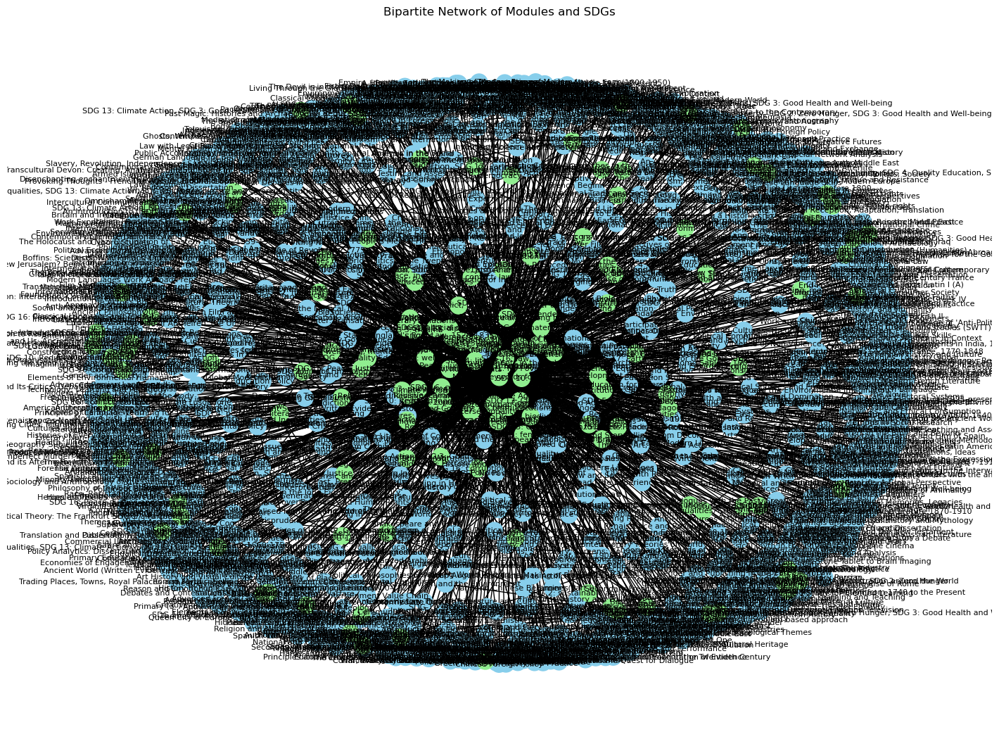

In [127]:
import networkx as nx
import matplotlib.pyplot as plt

# Create bipartite graph
bipartite_df = df_exploded[df_exploded['SDG'] != '']
B = nx.Graph()
module_nodes = bipartite_df['Module Name'].unique()
sdg_nodes = bipartite_df['SDG'].unique()

B.add_nodes_from(module_nodes, bipartite=0)
B.add_nodes_from(sdg_nodes, bipartite=1)
edges = list(bipartite_df[['Module Name', 'SDG']].itertuples(index=False, name=None))
B.add_edges_from(edges)

# Draw
pos = nx.spring_layout(B, k=0.35, iterations=50)
plt.figure(figsize=(14, 10))
nx.draw(B, pos, with_labels=True, node_size=300,
        font_size=8, node_color=['skyblue' if n in module_nodes else 'lightgreen' for n in B.nodes()])
plt.title("Bipartite Network of Modules and SDGs")
plt.tight_layout()
plt.show()


# 3. SDG Frequency Bar Chart

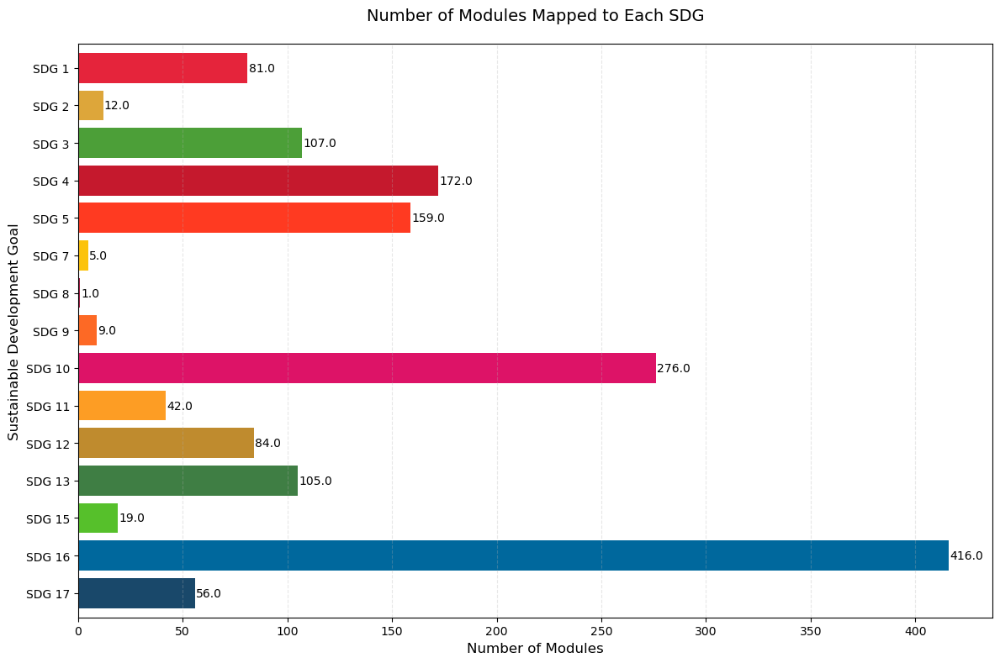

In [243]:
import pandas as pd
import matplotlib.pyplot as plt

# Official SDG color map
sdg_color_map = {
    '1': '#E5243B',    # No Poverty
    '2': '#DDA63A',    # Zero Hunger
    '3': '#4C9F38',    # Good Health
    '4': '#C5192D',    # Quality Education
    '5': '#FF3A21',    # Gender Equality
    '6': '#26BDE2',    # Clean Water
    '7': '#FCC30B',    # Affordable Energy
    '8': '#A21942',    # Decent Work
    '9': '#FD6925',    # Industry/Innovation
    '10': '#DD1367',   # Reduced Inequalities
    '11': '#FD9D24',   # Sustainable Cities
    '12': '#BF8B2E',   # Responsible Consumption
    '13': '#3F7E44',   # Climate Action
    '14': '#0A97D9',   # Life Below Water
    '15': '#56C02B',   # Life on Land
    '16': '#00689D',   # Peace/Justice
    '17': '#19486A',   # Partnerships
}

# Read and process data
df = pd.read_excel(filepath)
df = df[['Year', 'Matched SDG Keywords']]
df = df[df['Matched SDG Keywords'] != 'No SDG keywords found']

def extract_sdgs(text):
    sdgs = []
    parts = [part.strip() for part in text.replace(';', ',').split(',')]
    for part in parts:
        if 'SDG' in part:
            sdg_num = part.split('SDG')[1].split(':')[0].strip()
            sdgs.append(f"SDG {sdg_num}")
    return list(set(sdgs))

df['SDG'] = df['Matched SDG Keywords'].apply(extract_sdgs)
df_exploded = df.explode('SDG')

# Get SDG counts in proper order
sdg_order = [f"SDG {i}" for i in range(1,18)]
sdg_counts = df_exploded['SDG'].value_counts().reindex(sdg_order).dropna()

# Create plot with official colors
plt.figure(figsize=(12, 8))
colors = [sdg_color_map[sdg.split()[-1]] for sdg in sdg_counts.index]
sdg_counts.plot(kind='barh', color=colors, width=0.8)

# Formatting
plt.gca().invert_yaxis()  # SDG 1 at top
plt.xlabel("Number of Modules", fontsize=12)
plt.ylabel("Sustainable Development Goal", fontsize=12)
plt.title("Number of Modules Mapped to Each SDG", fontsize=14, pad=20)
plt.grid(axis='x', linestyle='--', alpha=0.3)

# Add value labels
for i, v in enumerate(sdg_counts):
    plt.text(v + 0.5, i, str(v), color='black', va='center')

plt.tight_layout()
plt.savefig('SDG_Module_Counts.png', dpi=300, bbox_inches='tight')
plt.show()

# 4. Treemap of Modules Grouped by SDG

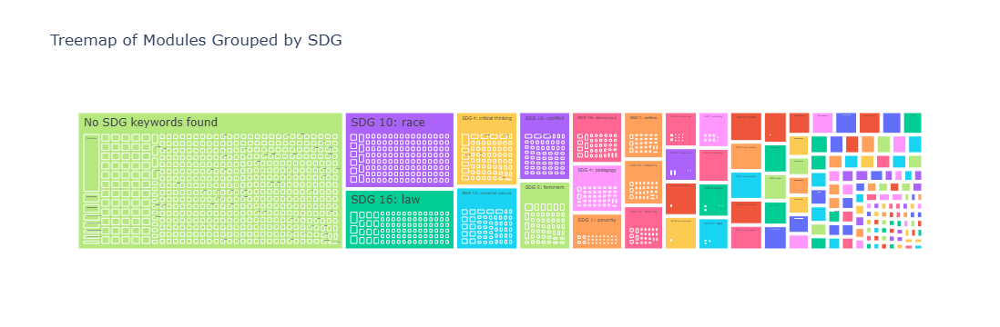

In [125]:
import plotly.express as px

# Prepare data
treemap_df = df_exploded[df_exploded['SDG'] != '']
treemap_counts = treemap_df.groupby(['SDG', 'Module Name']).size().reset_index(name='Count')

# Plot
fig = px.treemap(
    treemap_counts,
    path=['SDG', 'Module Name'],
    values='Count',
    color='SDG',
    title='Treemap of Modules Grouped by SDG'
)
fig.show()


# 5. Stacked Bar Chart: SDGs by Year

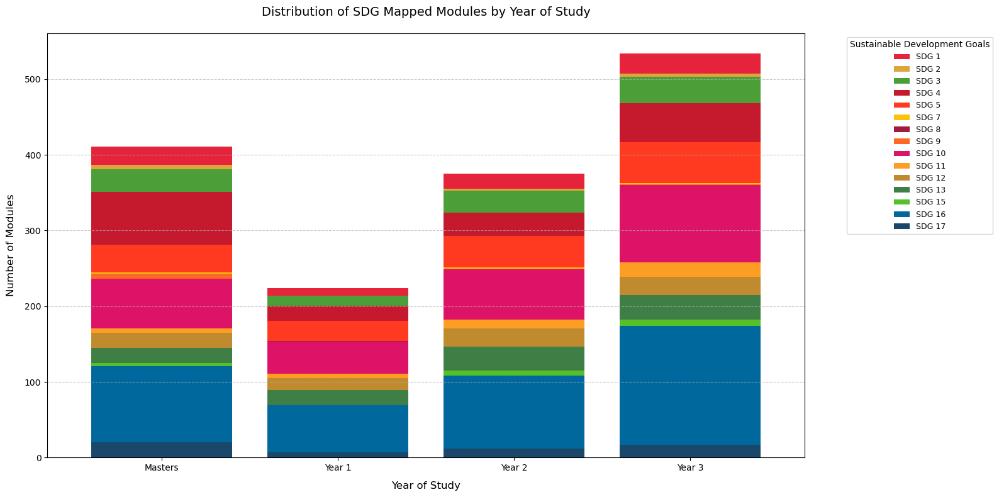

In [241]:
import pandas as pd
import matplotlib.pyplot as plt

# Official SDG color map
sdg_color_map = {
    '1': '#E5243B',
    '2': '#DDA63A',
    '3': '#4C9F38',
    '4': '#C5192D',
    '5': '#FF3A21',
    '6': '#26BDE2',
    '7': '#FCC30B',
    '8': '#A21942',
    '9': '#FD6925',
    '10': '#DD1367',
    '11': '#FD9D24',
    '12': '#BF8B2E',
    '13': '#3F7E44',
    '14': '#0A97D9',
    '15': '#56C02B',
    '16': '#00689D',
    '17': '#19486A',
}

# Read the Excel file
df = pd.read_excel(filepath)

# Extract relevant columns
df = df[['Year', 'Matched SDG Keywords']]

# Drop rows with no SDG data
df = df[df['Matched SDG Keywords'] != 'No SDG keywords found']

# Clean and standardize the SDG data
def extract_sdgs(text):
    sdgs = []
    # Split by ';' or ',' first
    parts = [part.strip() for part in text.replace(';', ',').split(',')]
    for part in parts:
        if 'SDG' in part:
            # Extract SDG number and optional keyword
            sdg_num = part.split('SDG')[1].split(':')[0].strip()
            sdgs.append(f"SDG {sdg_num}")
    return list(set(sdgs))  # Remove duplicates

# Apply the function to create a list of SDGs for each row
df['SDG'] = df['Matched SDG Keywords'].apply(extract_sdgs)

# Explode the list so each SDG gets its own row
df_exploded = df.explode('SDG')

# Clean up the Year column
df_exploded['Year'] = df_exploded['Year'].str.replace('Stage ', 'Year ')

# Group data
stacked_data = df_exploded.groupby(['Year', 'SDG']).size().unstack(fill_value=0)

# Get only SDGs that exist in our data
existing_sdgs = [col for col in stacked_data.columns if col.startswith('SDG')]
existing_sdgs_sorted = sorted(existing_sdgs, key=lambda x: int(x.split()[1]))

# Filter and sort the columns (reverse order for proper stacking)
stacked_data = stacked_data[existing_sdgs_sorted[::-1]]  # Reverse for stacking order

# Create color list based on existing SDGs (in reverse order to match stacking)
colors = [sdg_color_map[sdg.split()[-1]] for sdg in existing_sdgs_sorted[::-1]]

# Plot with official SDG colors
ax = stacked_data.plot(kind='bar', 
                     stacked=True, 
                     figsize=(16, 8), 
                     color=colors,
                     width=0.8)

plt.title("Distribution of SDG Mapped Modules by Year of Study", 
         fontsize=14, pad=20)
plt.xlabel("Year of Study", fontsize=12, labelpad=10)
plt.ylabel("Number of Modules", fontsize=12, labelpad=10)

# Customize legend in ascending order (SDG 1 at top)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], 
          labels[::-1],  # Reverse to show SDG 1 first
          title="Sustainable Development Goals", 
          bbox_to_anchor=(1.05, 1), 
          loc='upper left', 
          fontsize=9,
          title_fontsize=10)

plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Save the figure
plt.savefig('SDG_Distribution_by_Year.png', dpi=300, bbox_inches='tight')
plt.show()

In [75]:
pip install squarify

Note: you may need to restart the kernel to use updated packages.


# 1. Treemap of SDG Distribution by Department

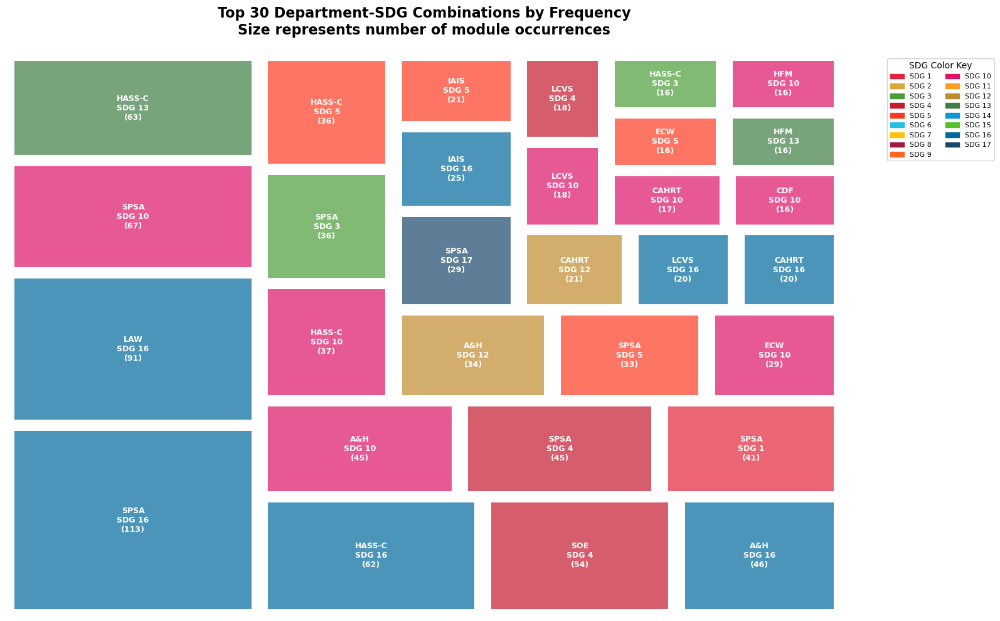

In [221]:
import pandas as pd
import squarify
import matplotlib.pyplot as plt
import re

# Official SDG colors (hex) - natural palette from UN
sdg_color_map = {
    '1': '#E5243B',
    '2': '#DDA63A',
    '3': '#4C9F38',
    '4': '#C5192D',
    '5': '#FF3A21',
    '6': '#26BDE2',
    '7': '#FCC30B',
    '8': '#A21942',
    '9': '#FD6925',
    '10': '#DD1367',
    '11': '#FD9D24',
    '12': '#BF8B2E',
    '13': '#3F7E44',
    '14': '#0A97D9',
    '15': '#56C02B',
    '16': '#00689D',
    '17': '#19486A',
}

# Read the Excel file
df = pd.read_excel(filepath)

# Function to extract SDGs from the 'Matched SDG Keywords' column
def extract_sdgs(text):
    if pd.isna(text) or "No SDG keywords found" in text:
        return []
    # Extract all SDG numbers using regex
    sdgs = re.findall(r'SDG\s*(\d+)', text)
    return [f"SDG {sdg}" for sdg in sdgs]

# Apply the function to create a list of SDGs for each row
df['SDGs'] = df['Matched SDG Keywords'].apply(extract_sdgs)

# Explode the list to have one row per SDG
sdg_df = df.explode('SDGs').dropna(subset=['SDGs'])

# Aggregate data by Department and SDG, then get top 30
dept_sdg_counts = sdg_df.groupby(['Department', 'SDGs']).size().reset_index(name='Count')
top_30 = dept_sdg_counts.sort_values('Count', ascending=False).head(30)

# Create color mapping for SDGs
top_30['color'] = top_30['SDGs'].apply(lambda x: sdg_color_map.get(x.split()[1], '#999999'))

plt.figure(figsize=(16, 10))

# Create treemap with proper labels and colors
squarify.plot(
    sizes=top_30['Count'],
    label=[f"{dept.split(' ')[0]}\n{sdg}\n({count})" for dept, sdg, count in 
          zip(top_30['Department'], top_30['SDGs'], top_30['Count'])],
    color=top_30['color'],
    alpha=0.7,
    text_kwargs={
        'fontsize':9, 
        'wrap':True,
        'color':'white',  # White text for better contrast
        'fontweight':'bold'
    },
    pad=0.005  # Add padding between rectangles
)

# Customize plot
plt.axis('off')
plt.title('Top 30 Department-SDG Combinations by Frequency\nSize represents number of module occurrences', 
         fontsize=16, pad=24, fontweight='bold')

# Add legend for SDG colors outside the plot
legend_patches = [plt.Rectangle((0,0),1,1, color=color, label=f"SDG {sdg}") for sdg, color in sdg_color_map.items()]
plt.legend(handles=legend_patches, 
           title='SDG Color Key',
           bbox_to_anchor=(1.05, 1),
           loc='upper left',
           ncol=2,
           fontsize=8,
           framealpha=0.9)

plt.tight_layout()

# Save high-quality image
plt.savefig('Top30_SDG_Department_Treemap.png', 
            dpi=300, 
            bbox_inches='tight',
            facecolor='white')
plt.show()

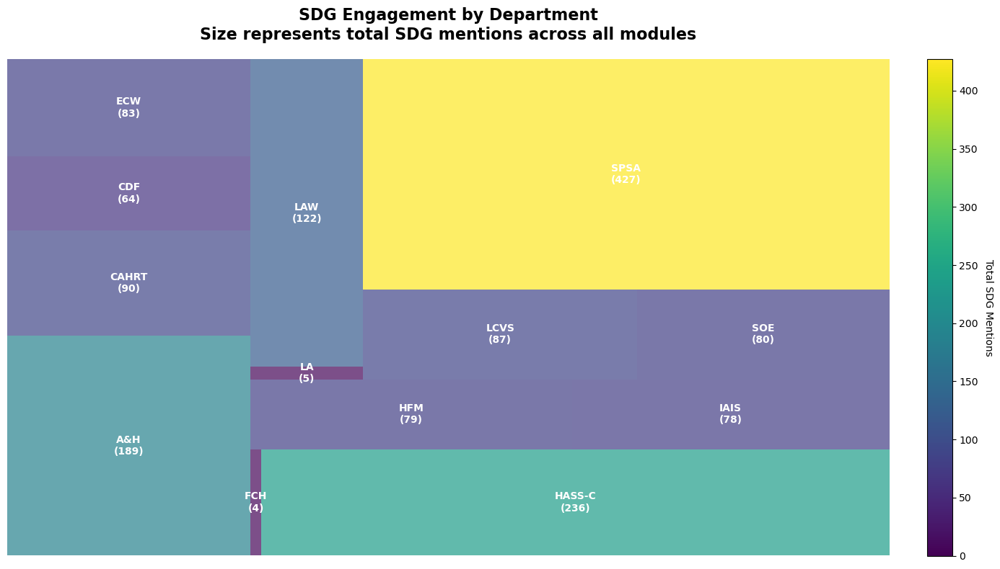

In [231]:
import pandas as pd
import squarify
import matplotlib.pyplot as plt
import re
import numpy as np

# Read the Excel file
df = pd.read_excel(filepath)

# Function to count SDGs per row
def count_sdgs(text):
    if pd.isna(text) or "No SDG keywords found" in text:
        return 0
    return len(re.findall(r'SDG\s*(\d+)', text))

# Count SDGs per module
df['SDG_Count'] = df['Matched SDG Keywords'].apply(count_sdgs)

# Aggregate by Department
dept_counts = df.groupby('Department')['SDG_Count'].sum().reset_index()

# Create figure and axis explicitly
fig, ax = plt.subplots(figsize=(14, 8))

# Create color gradient based on count
norm = plt.Normalize(vmin=0, vmax=max(dept_counts['SDG_Count']))
colors = plt.cm.viridis(norm(dept_counts['SDG_Count']))

# Create treemap
squarify.plot(
    sizes=dept_counts['SDG_Count'],
    label=[f"{dept}\n({count})" for dept, count in zip(dept_counts['Department'], dept_counts['SDG_Count'])],
    color=colors,
    alpha=0.7,
    text_kwargs={'fontsize':10, 'fontweight':'bold', 'color':'white'},
    pad=False,
    ax=ax  # Explicitly specify the axis
)

# Customize plot
ax.axis('off')
ax.set_title('SDG Engagement by Department\nSize represents total SDG mentions across all modules', 
            fontsize=16, pad=20, fontweight='bold')

# Create colorbar properly
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.03, pad=0.04)
cbar.set_label('Total SDG Mentions', rotation=270, labelpad=15)
# Save high-quality image
plt.savefig('Total SDG Mentioned.png', 
            dpi=300, 
            bbox_inches='tight',
            facecolor='white')
plt.tight_layout()
plt.savefig('Department_SDG_Treemap.png', dpi=300, bbox_inches='tight')
plt.show()

# 2. Circular Bar Plot for SDG Frequency

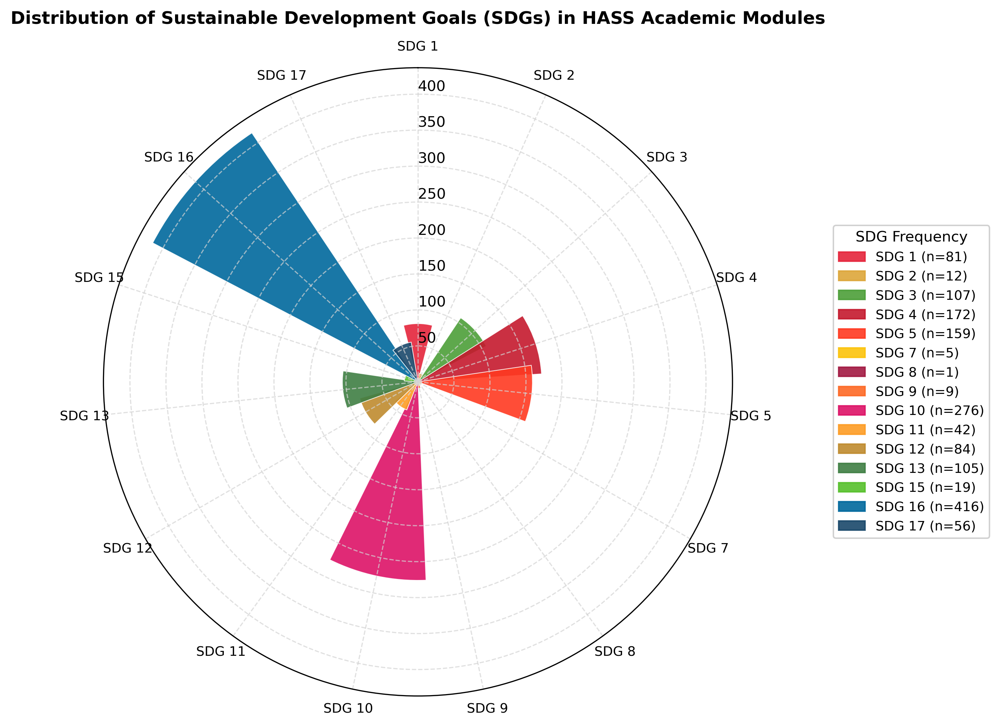

In [207]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re

# Official SDG colors (hex) - natural palette from UN
sdg_color_map = {
    '1': '#E5243B',
    '2': '#DDA63A',
    '3': '#4C9F38',
    '4': '#C5192D',
    '5': '#FF3A21',
    '6': '#26BDE2',
    '7': '#FCC30B',
    '8': '#A21942',
    '9': '#FD6925',
    '10': '#DD1367',
    '11': '#FD9D24',
    '12': '#BF8B2E',
    '13': '#3F7E44',
    '14': '#0A97D9',
    '15': '#56C02B',
    '16': '#00689D',
    '17': '#19486A',
}

# Read the Excel file
df = pd.read_excel(filepath)

# Function to extract SDGs from the 'Matched SDG Keywords' column
def extract_sdgs(text):
    if pd.isna(text) or "No SDG keywords found" in text:
        return []
    # Extract all SDG numbers using regex
    sdgs = re.findall(r'SDG\s*(\d+)', text)
    return [f"SDG {sdg}" for sdg in sdgs]

# Apply the function to create a list of SDGs for each row
df['SDGs'] = df['Matched SDG Keywords'].apply(extract_sdgs)

# Explode the list to have one row per SDG
sdg_df = df.explode('SDGs').dropna(subset=['SDGs'])

# Get SDG frequencies and sort them by SDG number in descending order for legend
sdg_freq = sdg_df['SDGs'].value_counts()
legend_order = sorted(sdg_freq.index, key=lambda x: int(x.split()[1]), reverse=False)
sdg_freq = sdg_freq.loc[legend_order]

# For the circular plot, we want numerical order (1-17)
plot_order = sorted(sdg_freq.index, key=lambda x: int(x.split()[1]))
values = sdg_freq[plot_order].values
angles = np.linspace(0, 2*np.pi, len(plot_order), endpoint=False)

# Create figure with higher DPI for better quality
plt.figure(figsize=(12, 7), dpi=300)
ax = plt.subplot(111, polar=True)

# Get colors in plot order (numerical)
colors = [sdg_color_map[sdg.split()[1]] for sdg in plot_order]

# Plot bars with official SDG colors
bars = ax.bar(angles, values, width=0.5, alpha=0.9, color=colors, 
              edgecolor='white', linewidth=0.5)

# Set x-ticks and labels
ax.set_xticks(angles)
ax.set_xticklabels(plot_order, fontsize=9)

# Create legend entries in descending order with official colors
legend_handles = [plt.Rectangle((0,0), 1, 1, color=sdg_color_map[sdg.split()[1]], alpha=0.9) 
                for sdg in legend_order]
legend_labels = [f"{sdg} (n={sdg_freq[sdg]})" for sdg in legend_order]

# Add legend on the right side
legend = ax.legend(legend_handles, legend_labels,
                  title="SDG Frequency",
                  loc='center left',
                  bbox_to_anchor=(1.15, 0.5),
                  fontsize=9,
                  framealpha=0.9)

# Customize plot appearance
ax.set_theta_offset(np.pi/2)
ax.set_theta_direction(-1)
ax.set_rlabel_position(0)
ax.grid(color='lightgray', linestyle='--', alpha=0.7)

# Add title
plt.title('Distribution of Sustainable Development Goals (SDGs) in HASS Academic Modules', 
         pad=30, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(right=0.7)

# Save as high-quality PNG (removed invalid quality parameter)
plt.savefig('SDG_Circular_Distribution.png', 
            dpi=300, 
            bbox_inches='tight', 
            facecolor='white')

plt.show()

# . Chord Diagram for SDG Co-occurrence



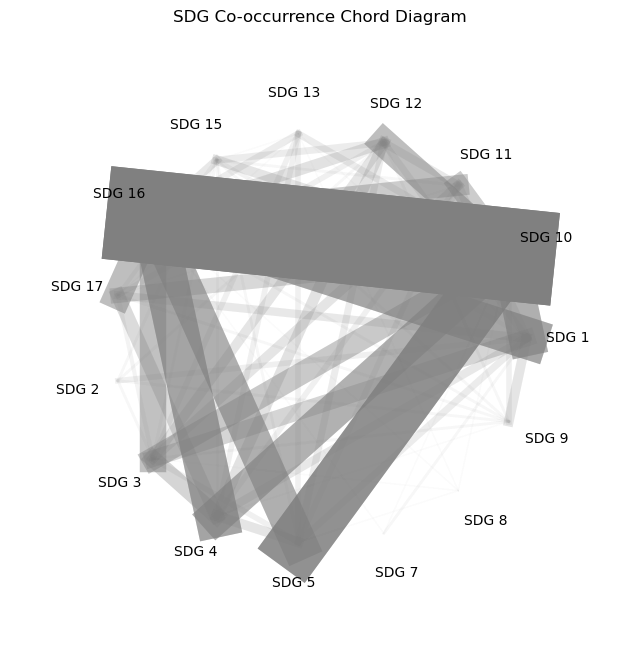

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
import matplotlib.patches as patches

# First, create sdg_df from your original data
# Assuming df is your original DataFrame containing the module data
# We need to extract SDG information from the 'Matched SDG Keywords' column

# Create an empty list to store SDG-module pairs
sdg_data = []

# Iterate through each row in the original data
for _, row in df.iterrows():
    module_code = row['Module Code']
    sdg_text = row['Matched SDG Keywords']
    
    # Skip if no SDG keywords
    if pd.isna(sdg_text) or sdg_text == 'No SDG keywords found':
        continue
    
    # Extract individual SDGs (this parsing might need adjustment based on your exact data format)
    sdg_items = [item.strip() for item in sdg_text.split(';')]
    
    for item in sdg_items:
        # Extract SDG number (this might need adjustment based on your data format)
        if 'SDG' in item:
            sdg_num = item.split(':')[0].strip()
            sdg_data.append({'Module Code': module_code, 'SDG': sdg_num})

# Create the sdg_df DataFrame
sdg_df = pd.DataFrame(sdg_data)

# Now proceed with your original code to create the matrix and plot
sdg_list = sorted(sdg_df['SDG'].unique())
matrix = pd.DataFrame(0, index=sdg_list, columns=sdg_list)

for module in df['Module Code'].unique():
    module_sdgs = sdg_df[sdg_df['Module Code'] == module]['SDG'].unique()
    for i in range(len(module_sdgs)):
        for j in range(i+1, len(module_sdgs)):
            matrix.loc[module_sdgs[i], module_sdgs[j]] += 1
            matrix.loc[module_sdgs[j], module_sdgs[i]] += 1

# Plot chord diagram
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.axis('off')

angles = np.linspace(0, 2*np.pi, len(sdg_list), endpoint=False)
radius = 1.0

for idx, (sdg, angle) in enumerate(zip(sdg_list, angles)):
    x = radius * np.cos(angle)
    y = radius * np.sin(angle)
    ax.text(x*1.2, y*1.2, sdg, ha='center', va='center')
    
    for jdx, (sdg2, angle2) in enumerate(zip(sdg_list, angles)):
        if matrix.iloc[idx, jdx] > 0 and idx != jdx:
            ax.plot([x, np.cos(angle2)*radius], 
                    [y, np.sin(angle2)*radius], 
                    color='gray', 
                    alpha=matrix.iloc[idx, jdx]/matrix.values.max(),
                    lw=matrix.iloc[idx, jdx])

plt.title('SDG Co-occurrence Chord Diagram')
plt.show()

# Sunburst Chart for Hierarchical Data

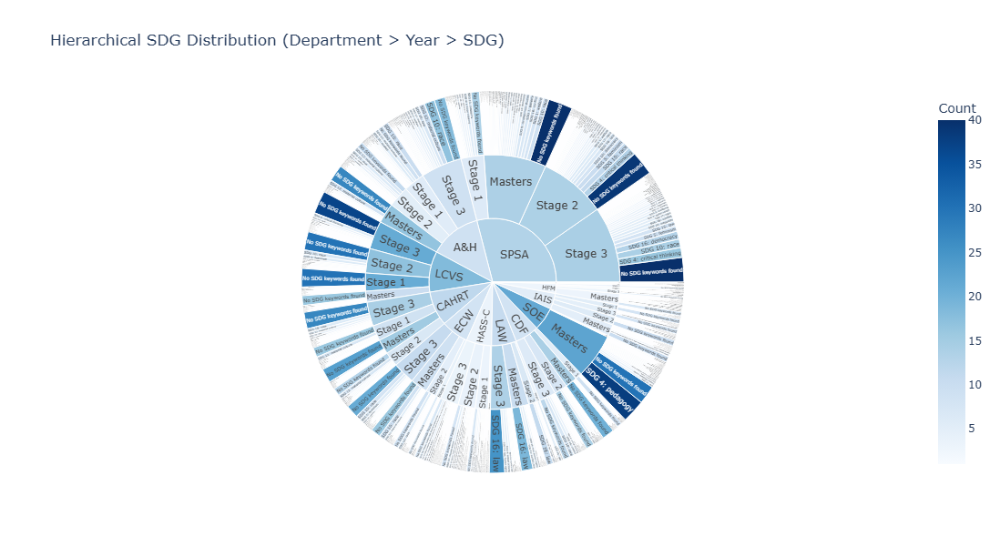

In [25]:
import plotly.express as px
import pandas as pd

# Assume df is already loaded
sdg_df = df.copy()

# Optional: Clean and split SDG column if multiple SDGs exist
sdg_df['Matched SDG Keywords'] = sdg_df['Matched SDG Keywords'].str.split(';')
sdg_df = sdg_df.explode('Matched SDG Keywords')
sdg_df['Matched SDG Keywords'] = sdg_df['Matched SDG Keywords'].str.strip()

# Group and count
hierarchical_df = sdg_df.groupby(['Department', 'Year', 'Matched SDG Keywords']).size().reset_index(name='Count')

# Plot sunburst
fig = px.sunburst(
    hierarchical_df,
    path=['Department', 'Year', 'Matched SDG Keywords'],
    values='Count',
    color='Count',
    color_continuous_scale='Blues',
    title='Hierarchical SDG Distribution (Department > Year > SDG)',
    width=800,
    height=600
)

fig.show()


# Dot Matrix Chart

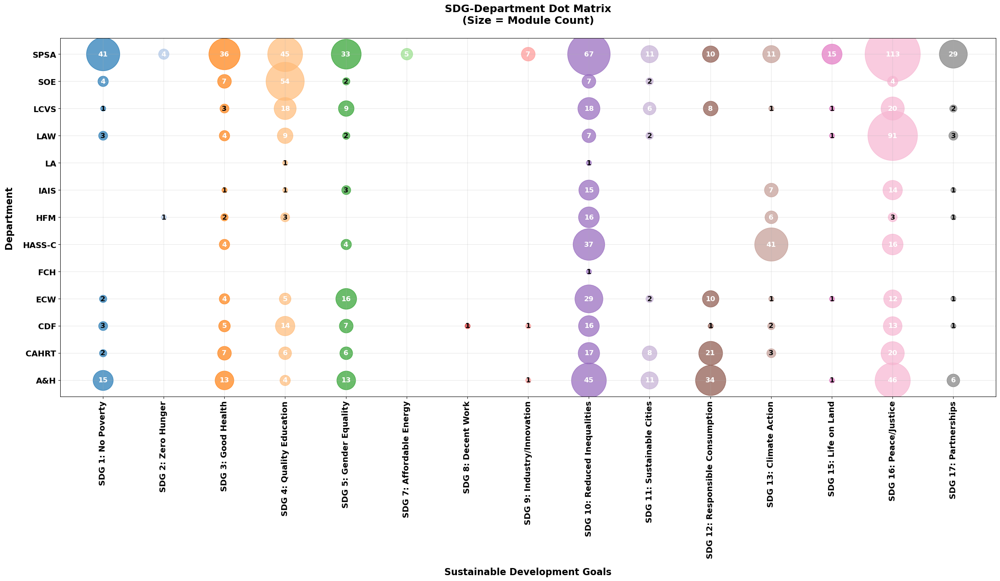

In [333]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Set global font properties
rcParams['font.weight'] = 'bold'
rcParams['axes.labelweight'] = 'bold'
rcParams['axes.titleweight'] = 'bold'

# SDG names in order from 1 to 17
sdg_names = {
    '1': 'No Poverty',
    '2': 'Zero Hunger',
    '3': 'Good Health',
    '4': 'Quality Education',
    '5': 'Gender Equality',
    '6': 'Clean Water',
    '7': 'Affordable Energy',
    '8': 'Decent Work',
    '9': 'Industry/Innovation',
    '10': 'Reduced Inequalities',
    '11': 'Sustainable Cities',
    '12': 'Responsible Consumption',
    '13': 'Climate Action',
    '14': 'Life Below Water',
    '15': 'Life on Land',
    '16': 'Peace/Justice',
    '17': 'Partnerships'
}

# Load the Excel file
df = pd.read_excel(filepath)

# Process SDG data
data = []
for _, row in df.iterrows():
    dept = row['Department']
    sdg_text = row['Matched SDG Keywords']
    
    if pd.notna(sdg_text) and 'No SDG keywords found' not in sdg_text:
        for part in str(sdg_text).split(';'):
            if 'SDG' in part:
                sdg_num = part.split('SDG')[1].split(':')[0].strip()
                sdg_label = f"SDG {sdg_num}: {sdg_names.get(sdg_num, '')}"
                data.append({'Department': dept, 'SDG': sdg_label, 'SDG_num': int(sdg_num)})

# Create DataFrame and count occurrences
sdg_df = pd.DataFrame(data)
counts = sdg_df.groupby(['SDG', 'Department', 'SDG_num']).size().reset_index(name='Count')
counts = counts.sort_values('SDG_num')
sdgs = counts['SDG'].unique()
depts = sorted(counts['Department'].unique())

# Create dot chart with larger figure size
plt.figure(figsize=(24, 14))

for i, sdg in enumerate(sdgs):
    for j, dept in enumerate(depts):
        count = counts[(counts['SDG'] == sdg) & (counts['Department'] == dept)]['Count'].values
        if len(count) > 0:
            plt.scatter(
                i, j,
                s=count[0]*80,  # Increased dot size scaling
                alpha=0.7,
                color=plt.cm.tab20(i)
            )
            plt.text(
                i, j,
                str(count[0]),
                ha='center',
                va='center',
                color='white' if count[0] > 3 else 'black',
                fontsize=12,  # Increased count font size
                weight='bold'
            )

# Customize axes with larger, bold fonts
plt.xticks(range(len(sdgs)), sdgs, rotation=90, fontsize=14, weight='bold')
plt.yticks(range(len(depts)), depts, fontsize=14, weight='bold')

# Add grid and titles with enhanced styling
plt.grid(True, alpha=0.3)
plt.title('SDG-Department Dot Matrix\n(Size = Module Count)', 
          pad=25, fontsize=18, weight='bold')
plt.xlabel('Sustainable Development Goals', fontsize=16, labelpad=15)
plt.ylabel('Department', fontsize=16, labelpad=15)

plt.tight_layout()

# Save high-quality PNG
plt.savefig('SDG_Department_Matrix_Bold.png', dpi=350, bbox_inches='tight')
plt.show()

# Bubble Chart with Multiple Dimensions

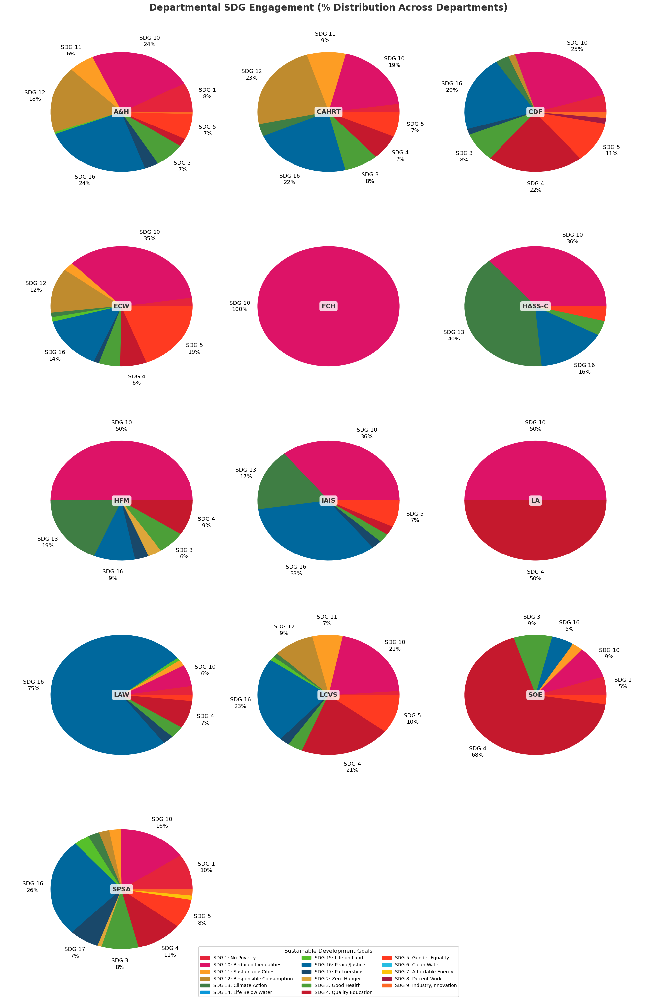

In [315]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Wedge
from matplotlib.collections import PatchCollection

# Load the Excel file
df = pd.read_excel(filepath)

# SDG names for reference
sdg_names = {
    '1': 'No Poverty',
    '2': 'Zero Hunger',
    '3': 'Good Health',
    '4': 'Quality Education',
    '5': 'Gender Equality',
    '6': 'Clean Water',
    '7': 'Affordable Energy',
    '8': 'Decent Work',
    '9': 'Industry/Innovation',
    '10': 'Reduced Inequalities',
    '11': 'Sustainable Cities',
    '12': 'Responsible Consumption',
    '13': 'Climate Action',
    '14': 'Life Below Water',
    '15': 'Life on Land',
    '16': 'Peace/Justice',
    '17': 'Partnerships'
}

# Clean the SDG Keywords column
df['Matched SDG Keywords'] = df['Matched SDG Keywords'].str.replace('No SDG keywords found', '')

# Extract all SDGs mentioned for each module
def extract_sdgs(text):
    if pd.isna(text) or text == '':
        return []
    sdgs = []
    parts = text.split(';')
    for part in parts:
        part = part.strip()
        if 'SDG' in part:
            sdg_num = part.split('SDG')[1].split(':')[0].strip()
            sdgs.append(sdg_num)
    return sdgs

df['SDGs'] = df['Matched SDG Keywords'].apply(extract_sdgs)

# Explode the SDGs column to have one row per SDG per module
df_exploded = df.explode('SDGs').dropna(subset=['SDGs'])

# Get department-level SDG distribution
dept_sdg_counts = df_exploded.groupby(['Department', 'SDGs']).size().unstack(fill_value=0)

# Calculate percentages for each department
dept_sdg_percent = dept_sdg_counts.div(dept_sdg_counts.sum(axis=1), axis=0) * 100

# UN SDG colors (extended to SDG 17)
sdg_colors = {
    '1': '#E5243B', '2': '#DDA63A', '3': '#4C9F38', '4': '#C5192D',
    '5': '#FF3A21', '6': '#26BDE2', '7': '#FCC30B', '8': '#A21942',
    '9': '#FD6925', '10': '#DD1367', '11': '#FD9D24', '12': '#BF8B2E',
    '13': '#3F7E44', '14': '#0A97D9', '15': '#56C02B', '16': '#00689D',
    '17': '#19486A'
}

# Get departments with SDG data
departments = dept_sdg_percent.index.tolist()

# Create figure with appropriate rows (3 departments per row)
num_rows = (len(departments) + 2) // 3  # Round up division
fig, axs = plt.subplots(num_rows, 1, figsize=(20, num_rows*6))  # Increased figure size
if num_rows == 1:
    axs = [axs]  # Ensure axs is iterable even with one row

plt.subplots_adjust(left=0.1, right=0.9, hspace=0.8, bottom=0.25)  # Increased spacing

# Split departments into rows (3 departments each)
dept_rows = [departments[i:i+3] for i in range(0, len(departments), 3)]

for row_idx, ax in enumerate(axs):
    if row_idx >= len(dept_rows):  # Skip if no departments for this row
        continue
        
    current_depts = dept_rows[row_idx]
    patches = []
    
    for i, dept in enumerate(current_depts):
        # Get SDG distribution for this department
        dept_data = dept_sdg_percent.loc[dept].dropna()
        total = dept_data.sum()
        
        if total == 0:  # Skip if no SDG data
            continue
            
        # Create wedges
        start = 0
        for sdg, pct in dept_data.items():
            if pct > 0:
                end = start + (pct * 3.6)  # Convert percentage to degrees
                wedge = Wedge((i*3.5, 0), 1.2, start, end, color=sdg_colors[sdg])  # Increased size and spacing
                patches.append(wedge)
                
                # Add percentage label for segments > 5%
                if pct >= 5:
                    mid_angle = np.deg2rad((start + end)/2)
                    label_x = i*3.5 + 1.5 * np.cos(mid_angle)  # Adjusted position
                    label_y = 0 + 1.5 * np.sin(mid_angle)
                    # Include SDG number in label with improved formatting
                    ax.text(label_x, label_y, f"SDG {sdg}\n{pct:.0f}%", 
                           ha='center', va='center', 
                           fontsize=12, linespacing=1.4,
                           bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.2'))
                
                start = end
        
        # Add department name in the center of the pie with improved styling
        ax.text(i*3.5, 0, dept, ha='center', va='center', 
               fontweight='bold', fontsize=14, color='#333333',
               bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', boxstyle='round,pad=0.3'))
    
    # Add all wedges to the plot
    ax.add_collection(PatchCollection(patches, match_original=True))
    
    # Set axis limits and turn off axes
    ax.set_xlim(-2, 3.5*3-1.5)  # Adjusted for new spacing
    ax.set_ylim(-2, 1.8)  # Increased y-limits
    ax.axis('off')

# Create a single legend for all subplots at the bottom with improved formatting
legend_patches = [plt.Rectangle((0,0),1,1, color=sdg_colors[sdg], 
                               label=f"SDG {sdg}: {sdg_names[sdg]}") 
                 for sdg in sorted(sdg_colors.keys())]

fig.legend(handles=legend_patches, title="Sustainable Development Goals",
          bbox_to_anchor=(0.5, 0.05), loc='upper center',
          ncol=3, fontsize=10, title_fontsize=12,
          frameon=True, framealpha=0.9, facecolor='white')

# Set main title with improved formatting
fig.suptitle("Departmental SDG Engagement (% Distribution Across Departments)", 
            y=1, fontsize=20, fontweight='bold', color='#333333')

# Add subtle grid in the background for better alignment
for ax in axs:
    ax.grid(False)

plt.tight_layout()
# Save as PDF with precise dimensions
output_path = "department_sdg_engagement.pdf"

# Create PDF with exact measurements (in inches)
fig.set_size_inches(20, num_rows*6)  # Match your display dimensions
fig.savefig(output_path, 
           format='pdf',
           dpi=300,
           bbox_inches='tight',
           facecolor='white',
           transparent=False,
           metadata={'Creator': 'SDG Visualization', 'Title': 'Departmental SDG Engagement'})
plt.show()

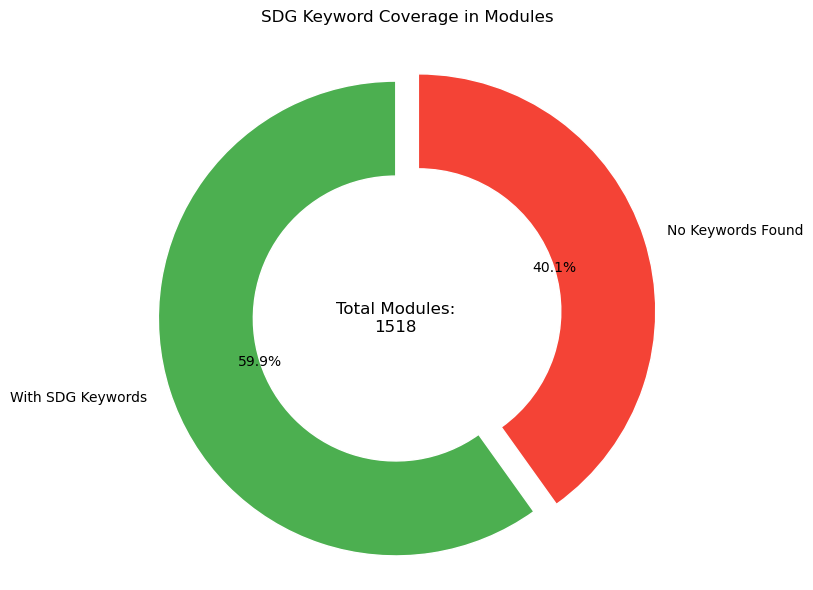

In [321]:
import pandas as pd
import matplotlib.pyplot as plt



df = pd.read_excel(filepath)

# Calculate the metrics
total_modules = len(df)
no_keyword_count = df[df['Matched SDG Keywords'].str.contains('No SDG keywords found', case=False, na=False)].shape[0]
has_keyword_count = total_modules - no_keyword_count

# Calculate percentages
no_keyword_pct = (no_keyword_count / total_modules) * 100
has_keyword_pct = (has_keyword_count / total_modules) * 100

# Create donut chart
fig, ax = plt.subplots(figsize=(8, 6))

# Data to plot
sizes = [has_keyword_pct, no_keyword_pct]
labels = ['With SDG Keywords', 'No Keywords Found']
colors = ['#4CAF50', '#F44336']
explode = (0, 0.1)  # Explode the "No Keywords" slice

# Draw pie chart (donut is a pie with a hole)
wedges, texts, autotexts = ax.pie(sizes, explode=explode, labels=labels, colors=colors,
                                  autopct='%1.1f%%', startangle=90,
                                  wedgeprops=dict(width=0.4, edgecolor='w'))

# Draw circle in the center to make it a donut
centre_circle = plt.Circle((0,0), 0.2, color='white', fc='white', linewidth=0)
fig.gca().add_artist(centre_circle)

# Add title and center text
plt.title('SDG Keyword Coverage in Modules', pad=20)
plt.text(0, 0, f"Total Modules:\n{total_modules}", ha='center', va='center', fontsize=12)

# Equal aspect ratio ensures pie is drawn as a circle
ax.axis('equal')  
plt.tight_layout()

plt.savefig('Module coverage.png', dpi=300, bbox_inches='tight')
# Show plot
plt.show()